![Machine Learning Lab](banner.jpg)

# Laboratorio 2 - Actividad Práctica

### 0. Instrucciones

1. Esta actividad debe ser entregada por BN antes y es de carácter individual. No se permite entregar el laboratorio después de la fecha establecida.
2. Al responder las preguntas de las actividades por favor marcar las respuestas con la sección a la que corresponden, por ejemplo: `## Exploracion de datos 2.1`. Es preferible que esto lo hagan con secciones de MarkDown como en el tutorial.
3. Por favor nombrar el archivo de acuerdo al siguiente formato `{email}_lab2.ipynb`.
4. Si tienen alguna duda pueden escribirme a mi correo `j.rayom@uniandes.edu.co` o contactarme directamente por Teams


### **Actividad: Predicción de reducción de emisiones en proyectos residenciales**

#### **1\. Exploración de Datos (10%)**

1.  **Cargar el dataset**:

    *   Descarga y carga el dataset `programmer3/carbon-reduction-in-residential-construction` usando `curl`. Ver [carbon-reduction-in-residential-construction](https://www.kaggle.com/datasets/programmer3/carbon-reduction-in-residential-construction)
    *   Elimine las columnas no pertinentes.
    *   Inspecciona las primeras filas del dataset para familiarizarte con su estructura.

2.  **Análisis descriptivo**:

    *   Usa `pandas_profiling` o `ydata_profiling` para generar un reporte del dataset.
    *   Responde las siguientes preguntas:
        1.  ¿Cuántas filas y columnas tiene el dataset?
        3.  ¿Cuál es la distribución de la variable objetivo (`Emission_Reduction_Class`)?
        4.  ¿Qué columnas no son numéricas?

#### **2\. Preparación de Datos (20%)**

1.  **Limpieza de datos**:
    *   Elimina las columnas con más del 50% de valores faltantes.
    *   Eliminar las columnas con alto correlacion entre si.
    *   Completa los valores faltantes en las columnas numéricas con la media.
    *   Completa los valores faltantes en las columnas categóricas con el valor más frecuente.

2.  **División de datos**:
    *   Separa el dataset en conjuntos de entrenamiento y prueba (80% train, 20% test).

3.  **Preprocesamiento**:
    *   Normaliza (Z-normalization) las columnas numéricas.
    *   Codifica las columnas categóricas usando `OneHotEncoder`.

#### **3\. Regresión Logística (30%)**

1.  **Entrenamiento del modelo**:
    *   Entrena un modelo de regresión logística para predecir la variable objetivo (`Emission_Reduction_Class`).

2.  **Evaluación del modelo**:
    *   Realiza predicciones sobre el conjunto de prueba.
    *   Calcula las métricas de evaluación: `precision`, `recall`, y `f1-score` para cada clase.
    *   Genera una matriz de confusión para visualizar el rendimiento del modelo.


#### **4\. Regularización y Optimización (40%)**

1.  **Regularización**:
    *   Entrena un modelo de regresión logística con regularización `L2` (`C=1.0`).
    *   Compara las métricas de evaluación (`precision`, `recall`, y `f1-score`) con el modelo sin regularización.

2.  **Optimización de hiperparámetros**:
    *   Usa `GridSearchCV` para encontrar los mejores hiperparámetros (`penalty` y `C`) para el modelo de regresión logística.
    *   Entrena el modelo optimizado y evalúa su rendimiento en el conjunto de prueba.
    *   Responde: ¿Mejoró el rendimiento del modelo después de la optimización?




### 1. Exploración de datos

#### 1.1. Carga del conjunto de datos

Descarga y carga del dataset **programmer3/carbon-reduction-in-residential-construction** haciendo uso de curl y pandas

In [1]:
%matplotlib inline

In [2]:
!curl -L -o ../datasets/carbon-reduction-in-residential-construction.zip https://www.kaggle.com/api/v1/datasets/download/programmer3/carbon-reduction-in-residential-construction

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 72327  100 72327    0     0  90840      0 --:--:-- --:--:-- --:--:--  210k


In [3]:
!unzip ../datasets/carbon-reduction-in-residential-construction.zip -d ../datasets/carbon-reduction-in-residential-construction

Archive:  ../datasets/carbon-reduction-in-residential-construction.zip
  inflating: ../datasets/carbon-reduction-in-residential-construction/Policy_Driven_Carbon_Reduction_1640.csv  


In [4]:
!ls ../datasets/carbon-reduction-in-residential-construction/

Policy_Driven_Carbon_Reduction_1640.csv


In [5]:
import pandas as pd

In [6]:
construction_data = pd.read_csv("../datasets/carbon-reduction-in-residential-construction/Policy_Driven_Carbon_Reduction_1640.csv")

In [7]:
construction_data.columns

Index(['Project_ID', 'Project_Type', 'Building_Area_m2',
       'Green_Certification_Level', 'Policy_Interventions', 'Lifecycle_Phase',
       'Embodied_Emissions_tCO2e', 'Operational_Emissions_tCO2e',
       'Supply_Chain_Emission_Share_%', 'ReadyMix_Concrete_Emission_tCO2e',
       'Electric_Power_Emission_tCO2e', 'Lighting_Fixture_Emission_tCO2e',
       'Material_Reuse_%', 'Renewable_Energy_%', 'Waste_Minimization_%',
       'Urban_Sustainability_Score', 'Total_Lifecycle_Emissions_tCO2e',
       'Emission_Reduction_%', 'Emission_Reduction_Class'],
      dtype='object')

Eliminación de las columnas no pertinentes para la tarea a realizar. En este caso se elimina **Project_ID** ya que es un identificador único para cada registro y no aporta información útil

In [8]:
construction_data = construction_data.drop(columns = ["Project_ID"])

In [9]:
construction_data.columns

Index(['Project_Type', 'Building_Area_m2', 'Green_Certification_Level',
       'Policy_Interventions', 'Lifecycle_Phase', 'Embodied_Emissions_tCO2e',
       'Operational_Emissions_tCO2e', 'Supply_Chain_Emission_Share_%',
       'ReadyMix_Concrete_Emission_tCO2e', 'Electric_Power_Emission_tCO2e',
       'Lighting_Fixture_Emission_tCO2e', 'Material_Reuse_%',
       'Renewable_Energy_%', 'Waste_Minimization_%',
       'Urban_Sustainability_Score', 'Total_Lifecycle_Emissions_tCO2e',
       'Emission_Reduction_%', 'Emission_Reduction_Class'],
      dtype='object')

Inspección de las primeras filas del dataset para familiarizarse con la estructura y variables a utilizar

In [10]:
construction_data.head()

,Project_Type,Building_Area_m2,Green_Certification_Level,Policy_Interventions,Lifecycle_Phase,Embodied_Emissions_tCO2e,Operational_Emissions_tCO2e,Supply_Chain_Emission_Share_%,ReadyMix_Concrete_Emission_tCO2e,Electric_Power_Emission_tCO2e,Lighting_Fixture_Emission_tCO2e,Material_Reuse_%,Renewable_Energy_%,Waste_Minimization_%,Urban_Sustainability_Score,Total_Lifecycle_Emissions_tCO2e,Emission_Reduction_%,Emission_Reduction_Class
0,High-rise,8702,Silver,2,Operation,956.45,725.68,55.2,534.28,383.47,38.27,45.0,65.4,15.2,87.9,1682.13,24.8,Medium
1,Low-rise,2368,Basic,2,Construction,1211.80,769.83,62.3,946.28,1035.56,260.64,16.1,10.3,2.5,50.3,1981.63,19.8,Medium
2,High-rise,15061,Platinum,2,Operation,210.56,2354.05,78.6,364.31,355.47,263.17,32.6,56.7,2.6,37.3,2564.61,44.3,High
3,High-rise,16012,Platinum,0,Operation,341.32,342.76,32.8,474.13,958.84,152.18,35.4,57.6,1.7,37.5,684.08,38.3,High
4,Low-rise,15399,Gold,0,End-of-life,1786.26,1806.09,58.7,808.26,676.74,163.98,38.9,49.6,16.4,69.7,3592.35,28.2,Medium


#### 1.2. Análisis descriptivo del conjunto de datos

Generación del reporte descriptivo del dataset haciendo uso de la herramienta **ydata_profiling** para la exploración exahustiva de las variables

In [11]:
from ydata_profiling import ProfileReport

In [12]:
profile = ProfileReport(construction_data, title = "Construction Data Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

| Pregunta | Respuesta |
|--------|-----------|
| ¿Cuántas filas y cuantás columnas tiene el dataset? | Originalmente, el dataset tiene **19 columnas** y **1640 filas**, sin embargo, luego de eliminar las variables que no son pertinentes para la tarea a realizar, el dataset quedó con un total de **18 columnas** y **1640 filas**. |
| ¿Cuál es la distribución de la variable objetivo *Emission_Reduction_Class*? | La variable objetivo es una variables categórica de 3 clases. Específicamente las clases asociadas a la variable son **High**, **Medium** y **Low**. En lo que respecta a su distribución, se puede evidenciar en el reporte que aproximadamente la mitad de los valores pertenecen a la clase **Medium** (826) y la otra mitad de los valores se distribuye entre la clase **High** (458) y **Low** (356). Esto indica claramente que la distribución de la variable objetivo esta desbalanceada, favoreciendo a la clase **Medium** |
| ¿Qué columnas no son numéricas? | El dataset cuenta con 4 columnas que no son numéricas. Específicamente las columnas categóricas son **Project_Type**, **Green_Certification_Level**, **Lifecycle_Phase** y **Emission_Reduction_Class**. Aunque el reporte clasifica **Policy_Interventions** como una variable categórica esta realmente corresponde a una variable numérica en un rango discreto, ya que cuenta el número de intervenciones de política implementadas en el proyecto y por ende establece un orden y sus valores tienen un significado cuantitativo.  |


### 2. Preparación de datos

#### 2.1. Limpieza de datos

Eliminación de las columnas con más del **50%** de valores faltantes del dataset. A partir del reporte generado se puede determinar que ningunas columna cuanta con más del 50% de valores faltantes, por lo cual no se elimina ninguna columna

In [13]:
(construction_data.isnull().sum() / len(construction_data)) * 100

Project_Type                         0.000000
Building_Area_m2                     0.000000
Green_Certification_Level           19.512195
Policy_Interventions                 0.000000
Lifecycle_Phase                      0.000000
Embodied_Emissions_tCO2e             0.000000
Operational_Emissions_tCO2e          0.000000
Supply_Chain_Emission_Share_%        0.000000
ReadyMix_Concrete_Emission_tCO2e     0.000000
Electric_Power_Emission_tCO2e        0.000000
Lighting_Fixture_Emission_tCO2e      0.000000
Material_Reuse_%                     0.000000
Renewable_Energy_%                   0.000000
Waste_Minimization_%                 0.000000
Urban_Sustainability_Score           0.000000
Total_Lifecycle_Emissions_tCO2e      0.000000
Emission_Reduction_%                 0.000000
Emission_Reduction_Class             0.000000
dtype: float64

Eliminación de las columnas con alta correlación entre sí. Para determinar las columnas se utiliza el reporte generado por **ydata-profiling**. Se decide eliminar la columna **Total_Lifecycle_Emissions_tCO2e** debido a su alta correlación con la variable **Operational_Emissions_tCO2e** debido a que **total** cuantifica la suma entre **operational** y **embodied**. A su vez se decide eliminar la variable **Emission_Reduction_%** ya que la variable objetivo es una discretización de esta, y mantenerla genera fugas de información en el modelo. Cabe resaltar que se tomaron como correlaciones altas aquellas mayores a 0.8

In [14]:
construction_data = construction_data.drop(columns = ["Total_Lifecycle_Emissions_tCO2e", "Emission_Reduction_%"])

In [15]:
construction_data.columns

Index(['Project_Type', 'Building_Area_m2', 'Green_Certification_Level',
       'Policy_Interventions', 'Lifecycle_Phase', 'Embodied_Emissions_tCO2e',
       'Operational_Emissions_tCO2e', 'Supply_Chain_Emission_Share_%',
       'ReadyMix_Concrete_Emission_tCO2e', 'Electric_Power_Emission_tCO2e',
       'Lighting_Fixture_Emission_tCO2e', 'Material_Reuse_%',
       'Renewable_Energy_%', 'Waste_Minimization_%',
       'Urban_Sustainability_Score', 'Emission_Reduction_Class'],
      dtype='object')

Completar los valores numéricos faltantes con la media de la columna correspondiente. En este dataset no se cuenta con valores faltantes en columnas numéricas, por lo cual no se realizan imputaciones en este paso

In [16]:
(construction_data.isnull().sum() / len(construction_data)) * 100

Project_Type                         0.000000
Building_Area_m2                     0.000000
Green_Certification_Level           19.512195
Policy_Interventions                 0.000000
Lifecycle_Phase                      0.000000
Embodied_Emissions_tCO2e             0.000000
Operational_Emissions_tCO2e          0.000000
Supply_Chain_Emission_Share_%        0.000000
ReadyMix_Concrete_Emission_tCO2e     0.000000
Electric_Power_Emission_tCO2e        0.000000
Lighting_Fixture_Emission_tCO2e      0.000000
Material_Reuse_%                     0.000000
Renewable_Energy_%                   0.000000
Waste_Minimization_%                 0.000000
Urban_Sustainability_Score           0.000000
Emission_Reduction_Class             0.000000
dtype: float64

Completar los valores categóricos faltantes con la moda o el valor más frecuente de la columa correspondiente. La variable **Green_Certification_Level** es la única con valores faltantes, por lo cual es la única variable a imputar en este paso

In [17]:
construction_data["Green_Certification_Level"] = (
    construction_data["Green_Certification_Level"]
    .fillna(construction_data["Green_Certification_Level"].mode()[0]))

In [18]:
(construction_data.isnull().sum() / len(construction_data)) * 100

Project_Type                        0.0
Building_Area_m2                    0.0
Green_Certification_Level           0.0
Policy_Interventions                0.0
Lifecycle_Phase                     0.0
Embodied_Emissions_tCO2e            0.0
Operational_Emissions_tCO2e         0.0
Supply_Chain_Emission_Share_%       0.0
ReadyMix_Concrete_Emission_tCO2e    0.0
Electric_Power_Emission_tCO2e       0.0
Lighting_Fixture_Emission_tCO2e     0.0
Material_Reuse_%                    0.0
Renewable_Energy_%                  0.0
Waste_Minimization_%                0.0
Urban_Sustainability_Score          0.0
Emission_Reduction_Class            0.0
dtype: float64

#### 2.2. División de datos

Separación del dataset en conjuntos de **entrenamiento (train)** y **prueba (test)**. Para garantizar reproducibilidad en la separación se utiliza la semilla 44.

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [20]:
X = construction_data.drop("Emission_Reduction_Class", axis = 1)
y = construction_data["Emission_Reduction_Class"]

In [21]:
X.columns

Index(['Project_Type', 'Building_Area_m2', 'Green_Certification_Level',
       'Policy_Interventions', 'Lifecycle_Phase', 'Embodied_Emissions_tCO2e',
       'Operational_Emissions_tCO2e', 'Supply_Chain_Emission_Share_%',
       'ReadyMix_Concrete_Emission_tCO2e', 'Electric_Power_Emission_tCO2e',
       'Lighting_Fixture_Emission_tCO2e', 'Material_Reuse_%',
       'Renewable_Energy_%', 'Waste_Minimization_%',
       'Urban_Sustainability_Score'],
      dtype='object')

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 44)

#### 2.3. Preprocesamiento de los datos

Normalización mediante el método **Z-normalitation** de las columnas numéricas del dataset. Es necesario normalizar ya que el modelo a utilizar para la clasificación es sensible a las escalas de las variables

In [23]:
numeric_features = X.select_dtypes(include = ["int64", "float64"]).columns
numeric_features

Index(['Building_Area_m2', 'Policy_Interventions', 'Embodied_Emissions_tCO2e',
       'Operational_Emissions_tCO2e', 'Supply_Chain_Emission_Share_%',
       'ReadyMix_Concrete_Emission_tCO2e', 'Electric_Power_Emission_tCO2e',
       'Lighting_Fixture_Emission_tCO2e', 'Material_Reuse_%',
       'Renewable_Energy_%', 'Waste_Minimization_%',
       'Urban_Sustainability_Score'],
      dtype='object')

In [24]:
numeric_pipeline = Pipeline(steps = [
    ("scaler", StandardScaler())
])

Codificación de las columnas categóricas haciendo uso de la técnica **OneHotEncoder**. Es necesario ya que el modelo a utilizar solo funciona con representaciones numéricas de las variables

In [25]:
categoric_features = X.select_dtypes(include = ["object", "category"]).columns
categoric_features

Index(['Project_Type', 'Green_Certification_Level', 'Lifecycle_Phase'], dtype='object')

In [26]:
categoric_pipeline = Pipeline(steps = [
    ("encoder", OneHotEncoder(handle_unknown = 'ignore'))
])

Se aplican los **pipelines** construidos al tipo de variables correspondientes con el fin de tener un **column transformer** que se pueda aplicar para transformar todo el dataset

In [27]:
preprocessor = ColumnTransformer(
    transformers=[
        ('numeric', numeric_pipeline, numeric_features),
        ('categoric', categoric_pipeline, categoric_features)
    ]
)

In [28]:
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

### 3. Regresión logística base

#### 3.1. Entrenamiento del modelo base

Entrenamiento del modelo de regresión logística base para predecir la variable **Emission_Reduction_Class**

In [29]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import seaborn as sns

In [30]:
base_logistic = LogisticRegression(max_iter = 1000, penalty = None)
base_logistic.fit(X_train_processed, y_train)

LogisticRegression(max_iter=1000, penalty=None)

#### 3.2. Evaluación del modelo base

Realizar predicciones sobre el conjunto de prueba con el modelo base entrenado

In [31]:
y_pred_test = base_logistic.predict(X_test_processed)

Calculo de las métricas de evaluación relevantes **precision**, **recall** y **f1-score** para cada una de las tres clases del modelo

In [32]:
precision_base = precision_score(y_test, y_pred_test, average = None)
recall_base = recall_score(y_test, y_pred_test, average = None)
f1_base = f1_score(y_test, y_pred_test, average = None)

print("Classes: ", base_logistic.classes_)
print()
print("Precision: ", precision_base)
print("Recall: ", recall_base)
print("F1 Score: ", f1_base)

Classes:  ['High' 'Low' 'Medium']

Precision:  [0.94318182 0.59677419 0.82022472]
Recall:  [0.91208791 0.60655738 0.82954545]
F1 Score:  [0.9273743  0.60162602 0.82485876]


Generación de una matriz de confusión para visualizar el rendimiento del modelo en la tarea de clasificación respecto a las diversas clases

In [33]:
accuracy_base = accuracy_score(y_test, y_pred_test)
conf_matrix_base = confusion_matrix(y_test, y_pred_test)
class_report_base = classification_report(y_test, y_pred_test)

print("Overall Accuracy", accuracy_base)
print()
print("Confusion Matrix:\n")
print(conf_matrix_base)
print()
print("Class Report:\n")
print(class_report_base)

Overall Accuracy 0.8109756097560976

Confusion Matrix:

[[ 83   0   8]
 [  0  37  24]
 [  5  25 146]]

Class Report:

              precision    recall  f1-score   support

        High       0.94      0.91      0.93        91
         Low       0.60      0.61      0.60        61
      Medium       0.82      0.83      0.82       176

    accuracy                           0.81       328
   macro avg       0.79      0.78      0.78       328
weighted avg       0.81      0.81      0.81       328



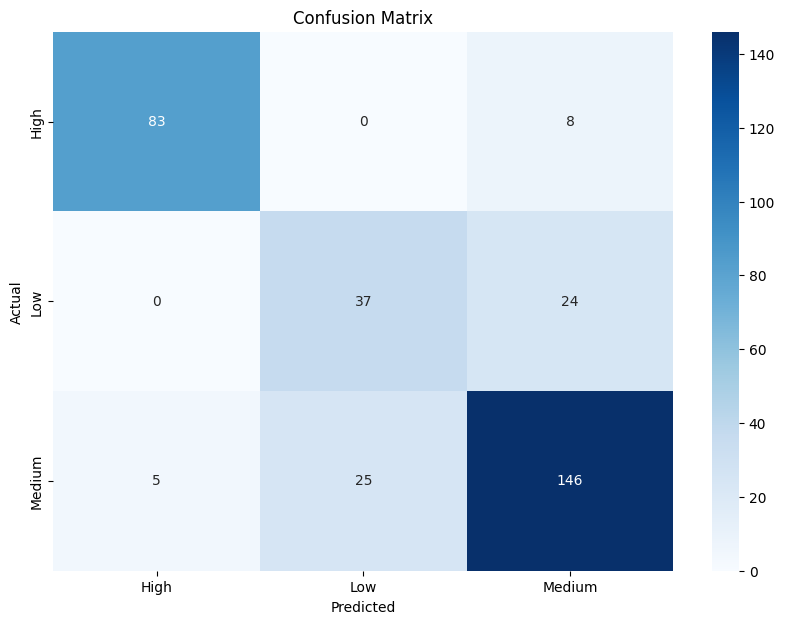

In [34]:
plt.figure(figsize = (10, 7))
sns.heatmap(conf_matrix_base, annot = True, fmt = "d", cmap = "Blues", xticklabels = base_logistic.classes_, yticklabels = base_logistic.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

### 4. Regularización y optimización del modelo

#### 4.1. Regularización

Entrenamiento de un modelo de regresión logística para la tarea de clasificación usando la técnica de **regularización L2** con coeficiente **C = 1**

In [35]:
l2_logistic = LogisticRegression(max_iter = 1000, penalty = "l2", C = 1.0)
l2_logistic.fit(X_train_processed, y_train)

LogisticRegression(max_iter=1000)

Comparación de las métricas obtenidas con el nuevo modelo con respecto a las métricas del modelo base sin regularización para la misma tarea. Al comparar las métricas obtenidas con el modelo base (sin regularización) y el modelo con regularización L2 (C = 1), se observa que los resultados son muy similares en términos de precisión, recall y F1-score para las tres clases (High, Medium y Low). Aunque existen pequeñas variaciones en algunos puntajes, estas diferencias no son significativas y no implican un cambio sustancial en el desempeño general del modelo.

En particular, la frontera de decisión prácticamente no se modificó entre ambos modelos. Esto significa que las predicciones generadas son casi idénticas, lo que explica que las métricas de evaluación sean muy cercanas. La regularización L2 introdujo únicamente un ligero ajuste en los coeficientes del modelo, pero no fue lo suficientemente fuerte como para alterar la clasificación final de los ejemplos.

In [36]:
y_pred_test_l2 = l2_logistic.predict(X_test_processed)

In [37]:
precision_l2 = precision_score(y_test, y_pred_test_l2, average = None)
recall_l2 = recall_score(y_test, y_pred_test_l2, average = None)
f1_l2 = f1_score(y_test, y_pred_test_l2, average = None)

print("Classes: ", base_logistic.classes_)
print()
print("Precision: ", precision_l2)
print("Recall: ", recall_l2)
print("F1 Score: ", f1_l2)

Classes:  ['High' 'Low' 'Medium']

Precision:  [0.95402299 0.59322034 0.81318681]
Recall:  [0.91208791 0.57377049 0.84090909]
F1 Score:  [0.93258427 0.58333333 0.82681564]


Generación de una matriz de confusión para visualizar el rendimiento del modelo en la tarea de clasificación respecto a las diversas clases

In [38]:
accuracy_l2 = accuracy_score(y_test, y_pred_test_l2)
conf_matrix_l2 = confusion_matrix(y_test, y_pred_test_l2)
class_report_l2 = classification_report(y_test, y_pred_test_l2)

print("Overall Accuracy", accuracy_l2)
print()
print("Confusion Matrix:\n")
print(conf_matrix_l2)
print()
print("Class Report:\n")
print(class_report_l2)

Overall Accuracy 0.8109756097560976

Confusion Matrix:

[[ 83   0   8]
 [  0  35  26]
 [  4  24 148]]

Class Report:

              precision    recall  f1-score   support

        High       0.95      0.91      0.93        91
         Low       0.59      0.57      0.58        61
      Medium       0.81      0.84      0.83       176

    accuracy                           0.81       328
   macro avg       0.79      0.78      0.78       328
weighted avg       0.81      0.81      0.81       328



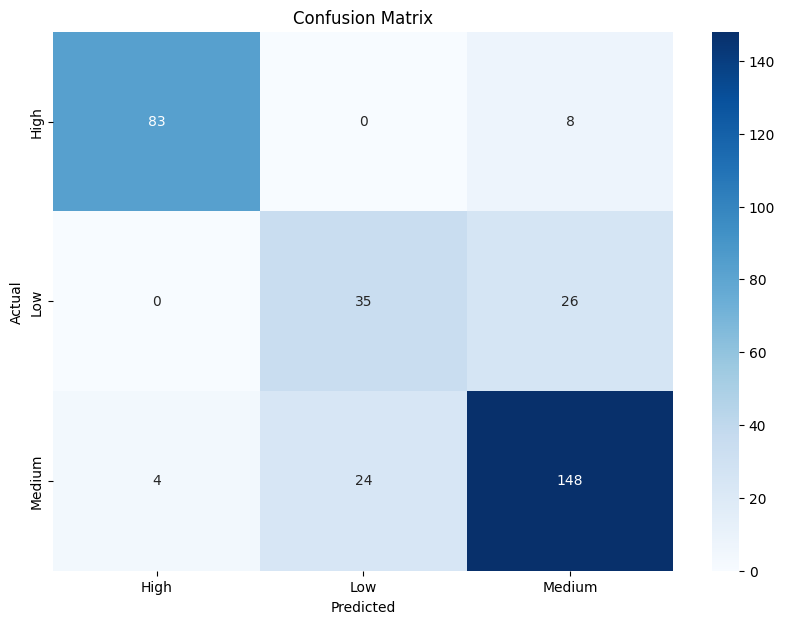

In [39]:
plt.figure(figsize = (10, 7))
sns.heatmap(conf_matrix_l2, annot = True, fmt = "d", cmap = "Blues", xticklabels = base_logistic.classes_, yticklabels = base_logistic.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()